In [3]:
import geopandas as gpd
import networkx as nx
import shapely
import matplotlib.pyplot as plt
import numpy as np

In [4]:
# Загружаем данные о дорогах и зданиях
roads_df = gpd.read_file('../data/vectors/Streets_исходные.shp')
buildings_df = gpd.read_file('../data/vectors/Дома_исходные.shp')

c:\Users\dkono\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyogrio\raw.py:198: RuntimeWarning: ../data/vectors/Дома_исходные.shp contains polygon(s) with rings with invalid winding order. Autocorrecting them, but that shapefile should be corrected using ogr2ogr for example.
  return ogr_read(


In [5]:
# Создаем граф
G = nx.Graph()

# Функция для добавления ребер в граф
def add_edge_to_graph(geometry, G):
    coords = list(geometry.coords)
    for i in range(len(coords) - 1):
        start = coords[i]
        end = coords[i + 1]
        if not G.has_edge(start, end):
            G.add_edge(start, end, weight=shapely.geometry.LineString([start, end]).length)

# Добавляем дороги в граф
for _, row in roads_df.iterrows():
    add_edge_to_graph(row['geometry'], G)

In [6]:
# Функция для нахождения ближайшего узла
def get_nearest_node(graph, x, y):
    nearest_node = None
    min_distance = float('inf')
    
    # Ищем ближайший узел среди всех узлов графа
    for node in graph.nodes():
        node_coords = node
        distance = np.linalg.norm(np.array(node_coords) - np.array([x, y]))
        if distance < min_distance:
            nearest_node = node
            min_distance = distance
    
    return nearest_node

# Находим ближайшие узлы для зданий
building_1_coords = buildings_df.iloc[152].geometry.centroid  # первое здание
building_2_coords = buildings_df.iloc[1000].geometry.centroid  # второе здание

In [7]:

start_node = get_nearest_node(G, building_1_coords.x, building_1_coords.y)
end_node = get_nearest_node(G, building_2_coords.x, building_2_coords.y)

# Находим кратчайший путь
shortest_path = nx.shortest_path(G, source=start_node, target=end_node, weight='weight')

# Визуализация
path_coords = np.array(shortest_path)

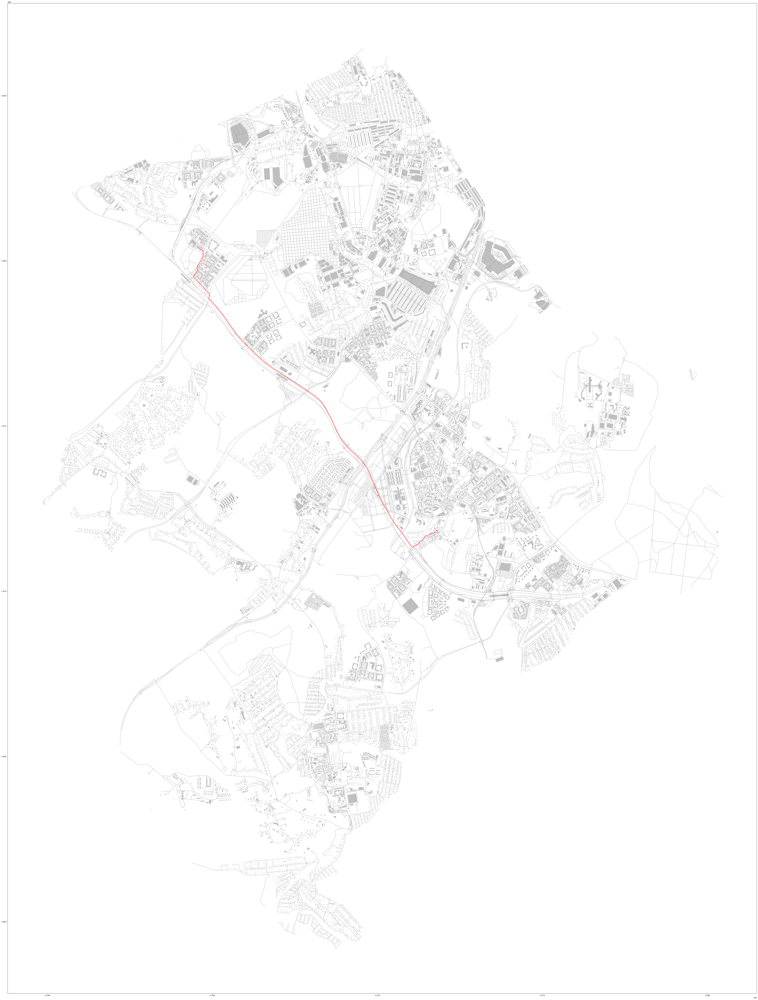

In [ ]:
# Строим граф
fig, ax = plt.subplots(figsize=(100, 100))

# Рисуем все дороги
buildings_df.plot(ax=ax, color='gray', alpha=0.5)
roads_df.plot(ax=ax, color='gray', alpha=0.5)
# Рисуем кратчайший путь
ax.plot(path_coords[:, 0], path_coords[:, 1], color='red', linewidth=2)
plt.savefig('./images/shortest_path.png')

plt.show()